## 1. Dependencies Setup

In [ ]:
import os
import sys
import torch
import cv2
import PIL.Image
import numpy as np
import imageio
import matplotlib.pyplot as plt

In [ ]:
def install_dependencies():
    print("⏳ Installing dependencies... (This may take a few minutes)")
    packages = [
        "diffusers", "transformers", "accelerate", "opencv-python",
        "imageio", "controlnet_aux", "safetensors"
    ]
    import subprocess
    for package in packages:
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "--quiet"])
    print("✅ Dependencies installed.")

try:
    import diffusers
    import controlnet_aux
except ImportError:
    install_dependencies()

⏳ Installing dependencies... (This may take a few minutes)
✅ Dependencies installed.


In [ ]:
from diffusers import (
    StableDiffusionXLControlNetPipeline,
    StableDiffusionXLControlNetInpaintPipeline,
    ControlNetModel,
    AutoencoderKL,
    AutoencoderTiny,
    UniPCMultistepScheduler
)
from diffusers.utils import load_image
from controlnet_aux import OpenposeDetector

/usr/local/lib/python3.12/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)
/usr/local/lib/python3.12/dist-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segmen

## 2. Visualizer

In [ ]:
class DiffusionVisualizer:
    """
    Captures intermediate steps of the diffusion process.
    Uses TinyVAE for ultra-fast preview decoding during the loop.
    """
    def __init__(self, tiny_vae, output_path="diffusion_trajectory.gif", decode_every=2):
        self.tiny_vae = tiny_vae
        self.output_path = output_path
        self.frames = []
        self.decode_every = decode_every

    def callback(self, pipe, step, timestep, callback_kwargs):
        """
        Callback function runs at the end of every scheduler step.
        """
        if step % self.decode_every != 0:
            return callback_kwargs

        latents = callback_kwargs["latents"]

        # Decode using Tiny VAE (Instant on A100)
        with torch.no_grad():
            # SDXL Latent scaling factor
            latents = latents / 0.13025
            image = self.tiny_vae.decode(latents).sample

        # Post-process image for visualization
        image = (image / 2 + 0.5).clamp(0, 1)
        image = image.cpu().permute(0, 2, 3, 1).numpy()[0]
        image = (image * 255).round().astype("uint8")

        # Resize for GIF to keep file size reasonable
        h, w, _ = image.shape
        scale = 0.5
        image_small = cv2.resize(image, (int(w * scale), int(h * scale)))

        self.frames.append(image_small)
        return callback_kwargs

    def save_gif(self, final_image=None, duration=0.1):
        """Compiles captured frames into a GIF."""
        if not self.frames:
            print("Warning: No frames captured.")
            return

        # Add the final result frame (high quality) at the end
        if final_image is not None:
            w, h = self.frames[0].shape[1], self.frames[0].shape[0]
            final_np = np.array(final_image.resize((w, h)))
            # Add final frame multiple times to 'pause' on the result
            for _ in range(15):
                self.frames.append(final_np)

        print(f"💾 Saving GIF to {self.output_path}...")
        imageio.mimsave(self.output_path, self.frames, duration=duration)
        print("✅ GIF Saved.")
        self.frames = []

In [ ]:
def show_images(original, control, result, title="Result"):
    """Helper to display images side-by-side."""
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    axs[0].imshow(original)
    axs[0].set_title("Original / Source")
    axs[0].axis("off")

    axs[1].imshow(control)
    axs[1].set_title("Control Signal / Mask")
    axs[1].axis("off")

    axs[2].imshow(result)
    axs[2].set_title(title)
    axs[2].axis("off")
    plt.tight_layout()
    plt.show()


## 3. Model Loader

In [ ]:
pipe_control = None
pipe_inpaint = None
tiny_vae = None

In [ ]:
def load_models():
    """
    Loads SDXL and ControlNet Union onto the A100.
    """
    global pipe_control, pipe_inpaint, tiny_vae

    device = "cuda"
    dtype = torch.float16

    if pipe_control is not None:
        return pipe_control, pipe_inpaint, tiny_vae

    print(f"🚀 Loading Models on A100 (Full VRAM Usage)...")

    # 1. Load Tiny VAE (for GIF)
    tiny_vae = AutoencoderTiny.from_pretrained(
        "madebyollin/taesdxl",
        torch_dtype=dtype
    ).to(device)

    # 2. Load ControlNet Union
    controlnet = ControlNetModel.from_pretrained(
        "xinsir/controlnet-union-sdxl-1.0",
        torch_dtype=dtype,
        use_safetensors=True
    )

    # 3. Load VAE (Standard)
    vae = AutoencoderKL.from_pretrained(
        "madebyollin/sdxl-vae-fp16-fix",
        torch_dtype=dtype
    )

    # 4. Text-to-Image Pipeline (For OpenPose)
    print("   Loading T2I Pipeline...")
    pipe_control = StableDiffusionXLControlNetPipeline.from_pretrained(
        "stabilityai/stable-diffusion-xl-base-1.0",
        controlnet=controlnet,
        vae=vae,
        torch_dtype=dtype,
        use_safetensors=True
    ).to(device)

    # 5. Inpaint Pipeline (For Inpainting/Outpainting)
    # Reusing components, but keeping both on GPU for instant switching
    print("   Loading Inpaint Pipeline...")
    pipe_inpaint = StableDiffusionXLControlNetInpaintPipeline(
        vae=pipe_control.vae,
        text_encoder=pipe_control.text_encoder,
        text_encoder_2=pipe_control.text_encoder_2,
        tokenizer=pipe_control.tokenizer,
        tokenizer_2=pipe_control.tokenizer_2,
        unet=pipe_control.unet,
        controlnet=pipe_control.controlnet,
        scheduler=pipe_control.scheduler,
        feature_extractor=None,
        image_encoder=None
    ).to(device)

    print("✅ Models Loaded Successfully.")
    return pipe_control, pipe_inpaint, tiny_vae

## 4. Inferencer

In [ ]:
def run_openpose_demo(prompt, image_url):
    print("\n--- Running OpenPose Demo ---")
    pipe, _, t_vae = load_models()

    # 1. Prepare Image
    original_image = load_image(image_url)

    # 2. Extract Pose
    print("Extracting Pose...")
    processor = OpenposeDetector.from_pretrained("lllyasviel/ControlNet")
    pose_image = processor(original_image, hand_and_face=True)
    pose_image = pose_image.resize((1024, 1024))

    # 3. Setup Visualizer
    viz = DiffusionVisualizer(t_vae, output_path="trajectory_openpose.gif")

    # 4. Generate
    print("Generating Image...")
    image = pipe(
        prompt,
        image=pose_image,
        num_inference_steps=30, # A100 can handle more steps easily
        controlnet_conditioning_scale=1.0,
        callback_on_step_end=viz.callback,
    ).images[0]

    viz.save_gif(final_image=image)
    image.save("result_openpose.png")
    show_images(original_image, pose_image, image, "OpenPose Result")
    return image

In [ ]:
def run_inpainting_demo(prompt, image_url):
    print("\n--- Running Inpainting Demo ---")
    _, pipe, t_vae = load_models()

    # 1. Load Image
    init_image = load_image(image_url).resize((1024, 1024))

    # 2. Create Mask (Example: Center Box)
    mask_image = PIL.Image.new("L", (1024, 1024), 0)
    draw = PIL.ImageDraw.Draw(mask_image)
    draw.rectangle([(256, 256), (768, 768)], fill=255) # Masked Area (White)

    # 3. Setup Visualizer
    viz = DiffusionVisualizer(t_vae, output_path="trajectory_inpaint.gif")

    # 4. Generate
    print("Inpainting...")
    image = pipe(
        prompt,
        image=init_image,
        mask_image=mask_image,
        control_image=init_image, # Union model uses original image as control for inpainting
        num_inference_steps=30,
        strength=0.99,
        controlnet_conditioning_scale=0.5,
        callback_on_step_end=viz.callback
    ).images[0]

    viz.save_gif(final_image=image)
    image.save("result_inpaint.png")
    show_images(init_image, mask_image, image, "Inpainting Result")
    return image

In [ ]:
def run_outpainting_demo(prompt, image_url):
    """
    Extends an image horizontally.
    """
    print("\n--- Running Outpainting Demo ---")
    _, pipe, t_vae = load_models()

    # 1. Load Source
    source_img = load_image(image_url).resize((768, 768))

    # 2. Create Canvas (1024x768)
    target_w, target_h = 1024, 768
    canvas = PIL.Image.new("RGB", (target_w, target_h), (0, 0, 0))
    mask = PIL.Image.new("L", (target_w, target_h), 255) # Default White (Inpaint everything)

    # 3. Paste Source
    offset_x = 0
    canvas.paste(source_img, (offset_x, 0))

    # 4. Mask Logic: Black = Keep, White = Generate
    mask_draw = PIL.ImageDraw.Draw(mask)
    # Protect the pasted image area (Make it black)
    mask_draw.rectangle([(offset_x, 0), (offset_x + 768, 768)], fill=0)

    # 5. Setup Visualizer
    viz = DiffusionVisualizer(t_vae, output_path="trajectory_outpaint.gif")

    # 6. Generate
    print("Outpainting...")
    image = pipe(
        prompt,
        image=canvas,
        mask_image=mask,
        control_image=canvas, # Pass the canvas as control
        num_inference_steps=30,
        strength=1.0, # 1.0 needed for empty areas
        controlnet_conditioning_scale=0.5,
        callback_on_step_end=viz.callback
    ).images[0]

    viz.save_gif(final_image=image)
    image.save("result_outpaint.png")
    show_images(canvas, mask, image, "Outpainting Result")
    return image

## 5. Inferencens

# OpenPose


--- Running OpenPose Demo ---
Extracting Pose...


annotator/ckpts/body_pose_model.pth:   0%|          | 0.00/209M [00:00<?, ?B/s]

annotator/ckpts/hand_pose_model.pth:   0%|          | 0.00/147M [00:00<?, ?B/s]

facenet.pth:   0%|          | 0.00/154M [00:00<?, ?B/s]

Generating Image...


  0%|          | 0/30 [00:00<?, ?it/s]

💾 Saving GIF to trajectory_openpose.gif...
✅ GIF Saved.


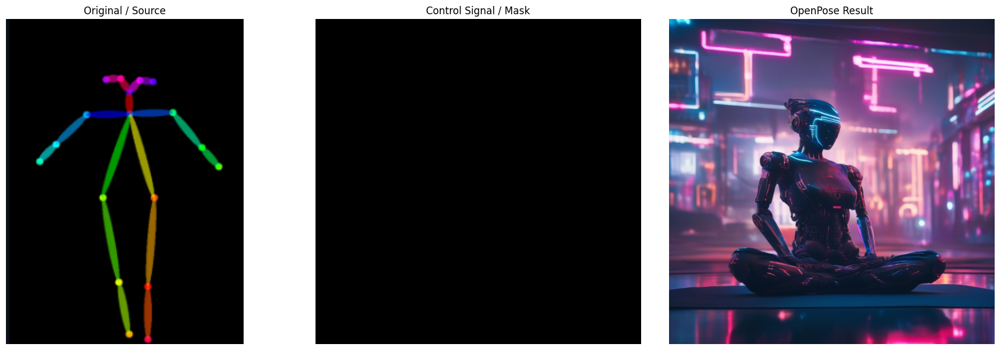

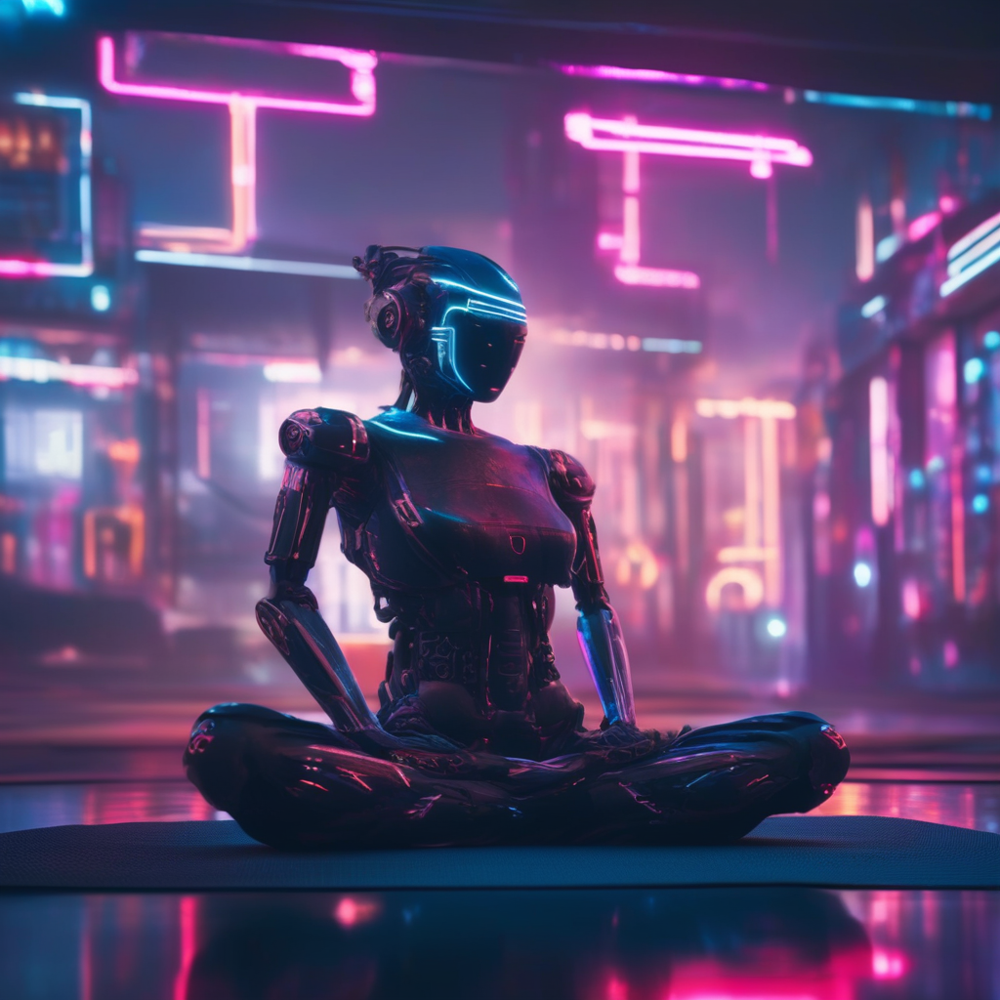

In [ ]:

# Example 1: OpenPose
pose_prompt = "cinematic photo of a cyberpunk robot doing yoga, neon lights, 8k"
pose_url = "yoga.png"
run_openpose_demo(pose_prompt, pose_url)



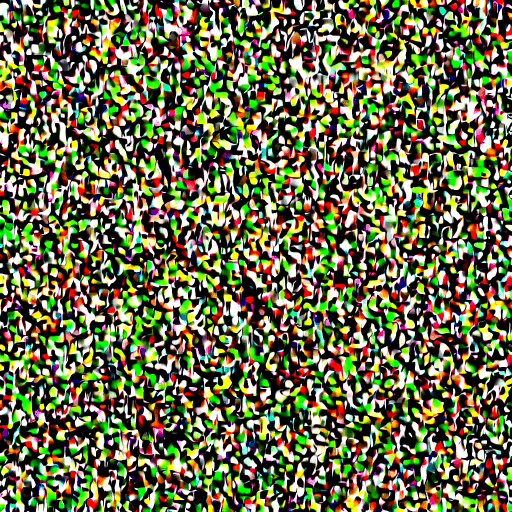

In [ ]:
from IPython.display import Image, display

# Display a local GIF file
display(Image(filename="trajectory_openpose.gif"))



# Inpainting


--- Running Inpainting Demo ---
Inpainting...


  0%|          | 0/29 [00:00<?, ?it/s]

💾 Saving GIF to trajectory_inpaint.gif...
✅ GIF Saved.


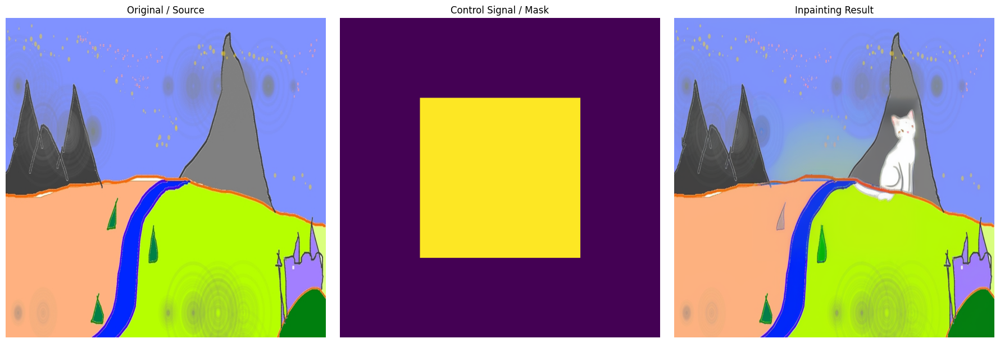

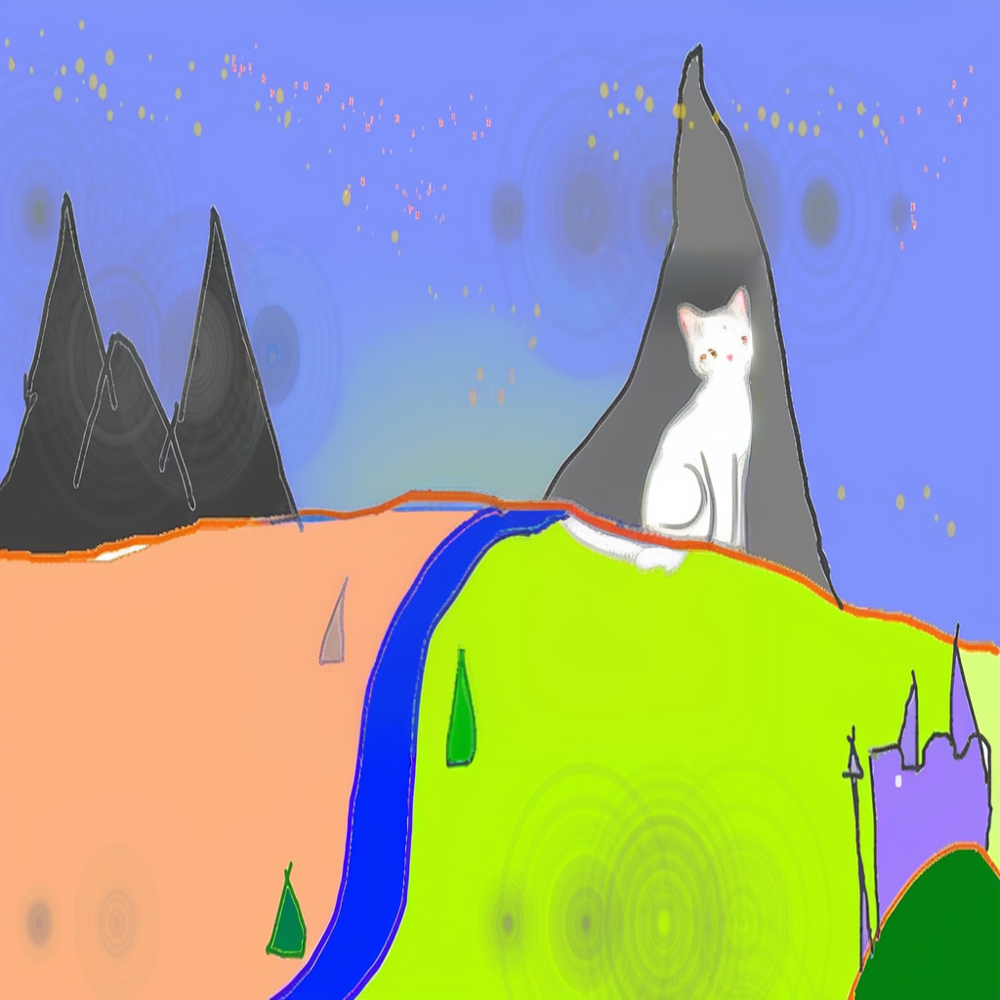

In [ ]:
# Example 2: Inpainting
inpaint_prompt = "a cute fluffy white cat sitting on a park bench"
inpaint_url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"
run_inpainting_demo(inpaint_prompt, inpaint_url)



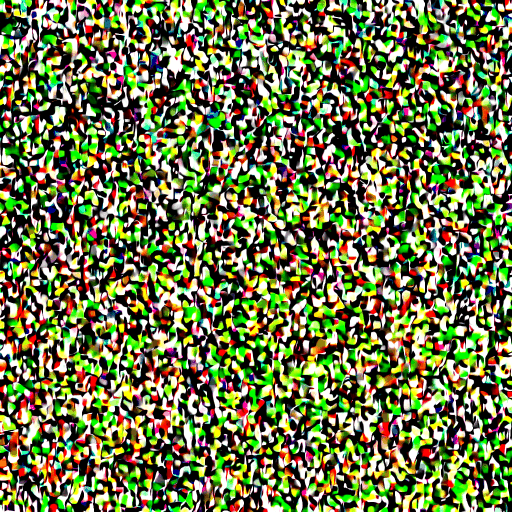

In [ ]:
from IPython.display import Image, display

# Display a local GIF file
display(Image(filename="trajectory_inpaint.gif"))

# Outpainting


--- Running Outpainting Demo ---
Outpainting...


  0%|          | 0/30 [00:00<?, ?it/s]

💾 Saving GIF to trajectory_outpaint.gif...
✅ GIF Saved.


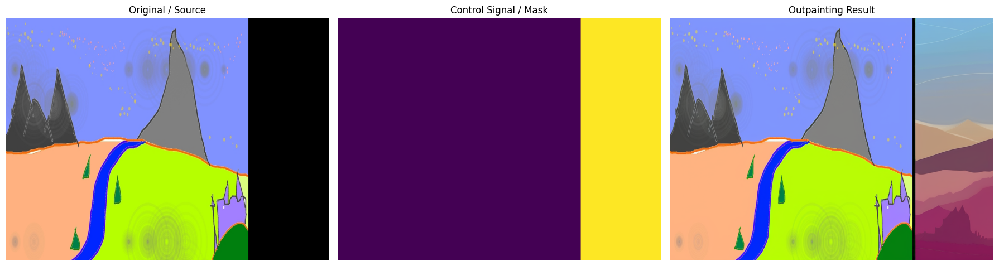

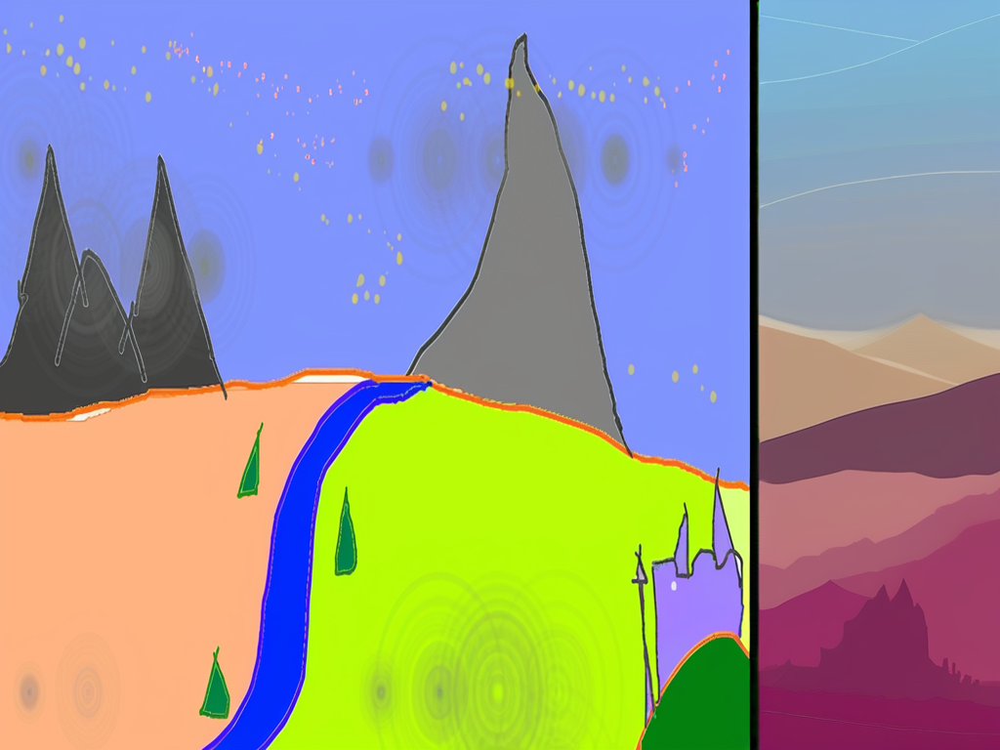

In [ ]:
# Example 3: Outpainting
outpaint_prompt = "beautiful mountain landscape extended, high resolution"
outpaint_url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"
run_outpainting_demo(outpaint_prompt, outpaint_url)

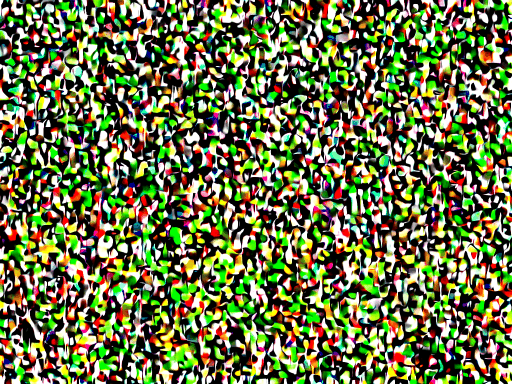

In [ ]:
from IPython.display import Image, display

# Display a local GIF file
display(Image(filename="trajectory_outpaint.gif"))